In [1]:
!pip install segyio
!pip install segysak
!pip install patchify
!pip install segmentation_models_3D

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 84 kB 1.7 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 310 kB 4.0 MB/s 
     |████████████████████████████████| 42 kB 1.6 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 961 kB/s 
     |████████████████████████████████| 50 kB 6.4 MB/s 


In [2]:

import tensorflow as tf
import keras
print(tf.__version__)
print(keras.__version__)

2.8.2
2.8.0


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import os
import segyio
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import segmentation_models_3D as sm
from patchify import patchify, unpatchify
import Augment as a
# import Patchify as p
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers import Adam
from keras.models import load_model
from segysak.segy import segy_header_scan, segy_header_scrape, get_segy_texthead, segy_loader
from keras.metrics import MeanIoU
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from matplotlib.colors import LinearSegmentedColormap
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input, Add
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG19
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model



Segmentation Models: using `tf.keras` framework.


/usr/local/lib/python3.7/dist-packages/segysak/segy/_segy_core.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [5]:
# Normalization
def normalization(data, clip_factor=2.5):
  clipFactor = clip_factor
  std0 = np.std(data)
  stdClip = std0 * clipFactor
  clippedCube = np.clip(data, -stdClip, +stdClip)
  return np.asarray(clippedCube / stdClip, dtype='single')

## Dataset Preparation

In [ ]:
train_seismic_path = '/content/drive/MyDrive/UTP_dGB_Documents/data/train/seis'
train_fault_path = '/content/drive/MyDrive/UTP_dGB_Documents/data/train/fault'

valid_seismic_path = '/content/drive/MyDrive/UTP_dGB_Documents/data/validation/seis'
valid_fault_path = '/content/drive/MyDrive/UTP_dGB_Documents/data/validation/fault'

In [ ]:
train_seis_input = []
train_fault_output = []

index = [0, 63, 127]
for i in os.listdir(train_seismic_path):
  for j in index:
    # iline
    train_seis_input.append(np.reshape(np.fromfile(train_seismic_path+'/'+i,dtype=np.single), (128, 128, 128))[j, :, :])
    train_fault_output.append(np.reshape(np.fromfile(train_fault_path+'/'+i,dtype=np.single), (128, 128, 128))[j, :, :])
    # xline
    train_seis_input.append(np.reshape(np.fromfile(train_seismic_path+'/'+i,dtype=np.single), (128, 128, 128))[:, j, :])
    train_fault_output.append(np.reshape(np.fromfile(train_fault_path+'/'+i,dtype=np.single), (128, 128, 128))[:, j, :])

In [ ]:
valid_seis_input = []
valid_fault_output = []

for i in os.listdir(valid_seismic_path):
  for j in index:
    # iline
    valid_seis_input.append(np.reshape(np.fromfile(valid_seismic_path+'/'+i,dtype=np.single), (128, 128, 128))[j, :, :])
    valid_fault_output.append(np.reshape(np.fromfile(valid_fault_path+'/'+i,dtype=np.single), (128, 128, 128))[j, :, :])
    # xline
    valid_seis_input.append(np.reshape(np.fromfile(valid_seismic_path+'/'+i,dtype=np.single), (128, 128, 128))[:, j, :])
    valid_fault_output.append(np.reshape(np.fromfile(valid_fault_path+'/'+i,dtype=np.single), (128, 128, 128))[:, j, :])

In [ ]:
np.array(train_seis_input).tofile('/content/drive/MyDrive/UTP_dGB_Documents/data/train/seis/1200.dat')
np.array(train_fault_output).tofile('/content/drive/MyDrive/UTP_dGB_Documents/data/train/fault/1200.dat')

In [ ]:
np.array(valid_seis_input).tofile('/content/drive/MyDrive/UTP_dGB_Documents/data/validation/seis/1200.dat')
np.array(valid_fault_output).tofile('/content/drive/MyDrive/UTP_dGB_Documents/data/validation/fault/1200.dat')

## Data Augmentation

In [24]:
train_seis_input = np.reshape(np.fromfile('/content/drive/MyDrive/UTP_dGB_Documents/data/train/seis/1200.dat', dtype=np.single), (1200, 128, 128))
train_fault_output = np.reshape(np.fromfile('/content/drive/MyDrive/UTP_dGB_Documents/data/train/fault/1200.dat', dtype=np.single), (1200, 128, 128))
valid_seis_input = np.reshape(np.fromfile('/content/drive/MyDrive/UTP_dGB_Documents/data/validation/seis/1200.dat', dtype=np.single), (120, 128, 128))
valid_fault_output = np.reshape(np.fromfile('/content/drive/MyDrive/UTP_dGB_Documents/data/validation/fault/1200.dat', dtype=np.single), (120, 128, 128))

In [25]:
aug = a.Augment()

In [26]:
# Grid Distort
train_seis_input_gds = []
train_fault_output_gds = []

for i in range(len(train_seis_input)):
  p1 = train_seis_input[i, :, :]
  t1 = train_fault_output[i, :, :]
  aug_result = aug.GridDistort(p1, t1)
  train_seis_input_gds.append(aug_result[0])
  train_fault_output_gds.append(aug_result[1])

In [27]:
# Sharpen
train_seis_input_shr = []
train_fault_output_shr = []

for i in range(len(train_seis_input)):
  p1 = train_seis_input[i, :, :]
  t1 = train_fault_output[i, :, :]
  aug_result = aug.Sharpen(p1, t1)
  train_seis_input_shr.append(aug_result[0])
  train_fault_output_shr.append(aug_result[1])

In [28]:
# Invert
train_seis_input_inv = []
train_fault_output_inv = []

for i in range(len(train_seis_input)):
  p1 = train_seis_input[i, :, :]
  t1 = train_fault_output[i, :, :]
  aug_result = aug.Invert(p1, t1)
  train_seis_input_inv.append(aug_result[0])
  train_fault_output_inv.append(aug_result[1])

In [29]:
# Up and down flip
train_seis_input_vflip = []
train_fault_output_vflip = []

for i in range(len(train_seis_input)):
  p1 = train_seis_input[i, :, :]
  t1 = train_fault_output[i, :, :]
  aug_result = aug.VFlip(p1, t1)
  train_seis_input_vflip.append(aug_result[0])
  train_fault_output_vflip.append(aug_result[1])

In [30]:
# Right and left flip
train_seis_input_hflip = []
train_fault_output_hflip = []

for i in range(len(train_seis_input)):
  p1 = train_seis_input[i, :, :]
  t1 = train_fault_output[i, :, :]
  aug_result = aug.hFlip(p1, t1)
  train_seis_input_hflip.append(aug_result[0])
  train_fault_output_hflip.append(aug_result[1])

In [31]:
# Right and left flip
train_seis_input_rot = []
train_fault_output_rot = []

for i in range(len(train_seis_input)):
  p1 = train_seis_input[i, :, :]
  t1 = train_fault_output[i, :, :]
  aug_result = aug.ShiftScaleRotate(p1, t1)
  train_seis_input_rot.append(aug_result[0])
  train_fault_output_rot.append(aug_result[1])

In [32]:
input_aug = [train_seis_input_gds, train_seis_input_shr,
             train_seis_input_inv, train_seis_input_vflip,
             train_seis_input_hflip,train_seis_input_rot]
train_seis_input_aug = []

for i in input_aug:
  train_seis_input_aug.append(np.array(i))
train_seis_input_aug = np.vstack(train_seis_input_aug)

In [33]:
output_aug = [train_fault_output_gds, train_fault_output_shr,
             train_fault_output_inv, train_fault_output_vflip,
             train_fault_output_hflip,train_fault_output_rot]
train_fault_output_aug = []

for i in output_aug:
  train_fault_output_aug.append(np.array(i))
train_fault_output_aug = np.vstack(train_fault_output_aug)

In [34]:
train_seis_input = np.append(train_seis_input, train_seis_input_aug, axis=0)
train_fault_output = np.append(train_fault_output, train_fault_output_aug, axis=0)


In [35]:
X_train = np.stack((train_seis_input,)*3, axis=-1)
X_test = np.stack((valid_seis_input,)*3, axis=-1)

train_mask = np.expand_dims(train_fault_output, axis=3)
y_train = tf.keras.utils.to_categorical(train_mask, num_classes=2)
test_mask = np.expand_dims(valid_fault_output, axis=3)
y_test = tf.keras.utils.to_categorical(test_mask, num_classes=2)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(8400, 128, 128, 3)
(120, 128, 128, 3)
(8400, 128, 128, 2)
(120, 128, 128, 2)


In [36]:
X_train_norm = normalization(X_train)
X_test_norm = normalization(X_test)


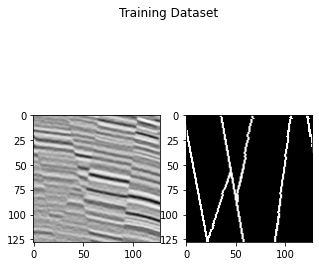

In [37]:
fig, ax = plt.subplots(1, 2, figsize=(5,5))
ax[0].imshow(X_train_norm[1, :, :, 1].T, cmap='Greys')
ax[1].imshow(y_train[1, :, :, 1].T, cmap='Greys_r')
fig.suptitle('Training Dataset')
plt.show()


## Training

In [38]:
batch_size = 8
image_size = 128

##### UNet

In [ ]:
def down_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    p = keras.layers.MaxPool2D((2, 2), (2, 2))(c)
    return c, p

def up_block(x, skip, filters, kernel_size=(3, 3), padding="same", strides=1):
    us = keras.layers.UpSampling2D((2, 2))(x)
    concat = keras.layers.Concatenate()([us, skip])
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(concat)
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

def bottleneck(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

In [ ]:
def UNet():
    f = [16, 32, 64, 128, 256]
    inputs = keras.layers.Input((image_size, image_size, 3))
    
    # encoder
    p0 = inputs
    c1, p1 = down_block(p0, f[0]) #128 -> 64
    c2, p2 = down_block(p1, f[1]) #64 -> 32
    c3, p3 = down_block(p2, f[2]) #32 -> 16
    c4, p4 = down_block(p3, f[3]) #16->8
    
    # bridge
    bn = bottleneck(p4, f[4])
    
    # decoder
    u1 = up_block(bn, c4, f[3]) #8 -> 16
    u2 = up_block(u1, c3, f[2]) #16 -> 32
    u3 = up_block(u2, c2, f[1]) #32 -> 64
    u4 = up_block(u3, c1, f[0]) #64 -> 128
    
    outputs = keras.layers.Conv2D(2, (1, 1), padding="same", activation="sigmoid")(u4)
    model = keras.models.Model(inputs, outputs)
    return model


In [ ]:
model_unet = UNet()
model_unet.compile(optimizer="adam", loss="binary_crossentropy", metrics=["acc"])

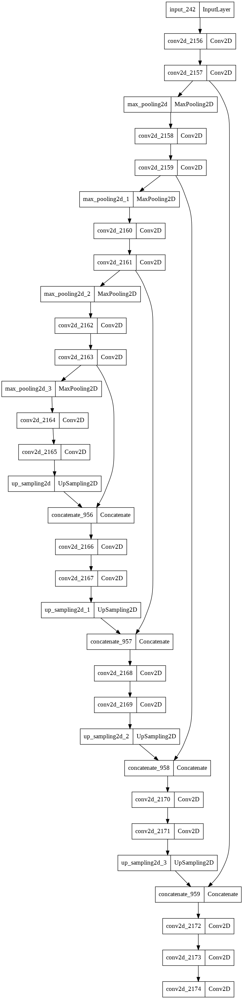

In [ ]:
plot_model(model_unet)

In [ ]:
train_steps = len(X_train_norm)//batch_size
valid_steps = len(X_test_norm)//batch_size

In [ ]:
history_1 = model_unet.fit(X_train_norm, 
                    y_train,
                    batch_size=batch_size, 
                    epochs=100,
                    verbose=1,
                    validation_data=(X_test_norm, y_test), ) # callbacks=EarlyStopping(monitor='val_acc', mode='max',patience=10))

Epoch 1/100
450/450 [==============================] - 14s 25ms/step - loss: 0.2109 - acc: 0.9410 - val_loss: 0.1490 - val_acc: 0.9514
Epoch 2/100
450/450 [==============================] - 11s 25ms/step - loss: 0.1307 - acc: 0.9553 - val_loss: 0.1234 - val_acc: 0.9574
Epoch 3/100
450/450 [==============================] - 11s 24ms/step - loss: 0.1154 - acc: 0.9592 - val_loss: 0.1204 - val_acc: 0.9595
Epoch 4/100
450/450 [==============================] - 11s 24ms/step - loss: 0.1075 - acc: 0.9611 - val_loss: 0.1121 - val_acc: 0.9603
Epoch 5/100
450/450 [==============================] - 11s 24ms/step - loss: 0.1022 - acc: 0.9623 - val_loss: 0.1098 - val_acc: 0.9613
Epoch 6/100
450/450 [==============================] - 10s 23ms/step - loss: 0.0971 - acc: 0.9635 - val_loss: 0.1172 - val_acc: 0.9610
Epoch 7/100
450/450 [==============================] - 11s 23ms/step - loss: 0.0926 - acc: 0.9644 - val_loss: 0.1209 - val_acc: 0.9611
Epoch 8/100
450/450 [==============================] - 

##### VGG19

In [ ]:
def vgg19_model():
    
    img_input = Input((image_size, image_size, 3))
        
    # Block 1
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = MaxPool2D((2, 2), strides=(2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = MaxPool2D((2, 2), strides=(2, 2), name='block2_pool')(x)

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv4')(x)
    pool3 = MaxPool2D((2, 2), strides=(2, 2), name='block3_pool')(x)

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(pool3)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv4')(x)
    pool4 = MaxPool2D((2, 2), strides=(2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(1024, (3, 3), activation='relu', padding='same', name='block5_conv1')(pool4)
    x = Conv2D(1024, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(1024, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    x = Conv2D(1024, (3, 3), activation='relu', padding='same', name='block5_conv4')(x)
    pool5 = MaxPool2D((2, 2), strides=(2, 2), name='block5_pool')(x)

    # decoder
    score_c5 = Conv2D(2, (1, 1), strides=(1, 1), padding='same', kernel_initializer='zeros')(pool5)
    up_c5 = Conv2DTranspose(2, (2, 2), strides=(2, 2), padding='valid')(score_c5)
    
    score_c4 = Conv2D(2, (1, 1), strides=(1, 1), padding='same', kernel_initializer='zeros')(pool4)
    fuse_16 = Add()([score_c4, up_c5])
    up_c4 = Conv2DTranspose(2, (2, 2), strides=(2, 2), padding='valid')(fuse_16)
    
    score_c3 = Conv2D(2, (1, 1), strides=(1, 1), padding='same', kernel_initializer='zeros')(pool3)
    fuse_32 = Add()([score_c3, up_c4])
    up_c3 = Conv2DTranspose(2, (8, 8), strides=(8, 8), padding='valid', activation='sigmoid')(fuse_32)

    model = Model(inputs=img_input, outputs=up_c3, name='vgg19')
    
    return model

In [ ]:
model_vgg = vgg19_model()
model_vgg.compile(optimizer="adam", loss="binary_crossentropy", metrics=["acc"])

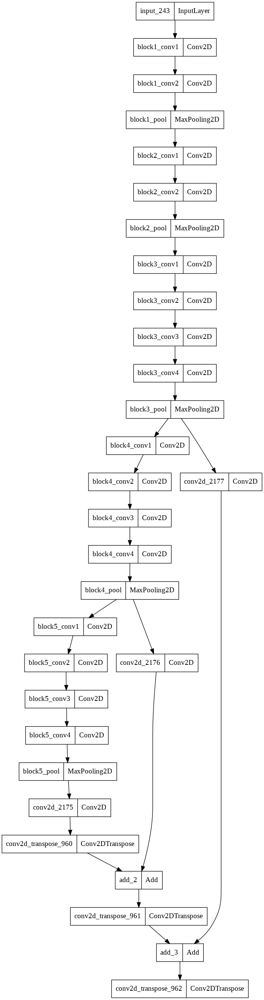

In [ ]:
plot_model(model_vgg)

In [ ]:
history_2 = model_vgg.fit(X_train_norm, 
                    y_train,
                    batch_size=batch_size, 
                    epochs=100,
                    verbose=1,
                    validation_data=(X_test_norm, y_test), ) # callbacks=EarlyStopping(monitor='val_acc', mode='max',patience=10))

Epoch 1/100
450/450 [==============================] - 49s 106ms/step - loss: 0.2776 - acc: 0.9159 - val_loss: 0.1880 - val_acc: 0.9352
Epoch 2/100
450/450 [==============================] - 48s 106ms/step - loss: 0.1690 - acc: 0.9387 - val_loss: 0.1546 - val_acc: 0.9379
Epoch 3/100
450/450 [==============================] - 48s 106ms/step - loss: 0.1459 - acc: 0.9412 - val_loss: 0.1474 - val_acc: 0.9403
Epoch 4/100
450/450 [==============================] - 48s 106ms/step - loss: 0.1391 - acc: 0.9422 - val_loss: 0.1419 - val_acc: 0.9406
Epoch 5/100
450/450 [==============================] - 48s 106ms/step - loss: 0.1353 - acc: 0.9427 - val_loss: 0.1418 - val_acc: 0.9414
Epoch 6/100
450/450 [==============================] - 48s 106ms/step - loss: 0.1307 - acc: 0.9433 - val_loss: 0.1387 - val_acc: 0.9417
Epoch 7/100
450/450 [==============================] - 48s 106ms/step - loss: 0.1272 - acc: 0.9437 - val_loss: 0.1443 - val_acc: 0.9415
Epoch 8/100
450/450 [===========================

##### UNet VGG19

In [39]:
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_vgg19_unet(input_shape, freeze=1):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained VGG19 Model """
    vgg19 = VGG19(include_top=False, weights="imagenet", input_tensor=inputs)
    
    """ 
        Select Freeze layer 
        VGG 19, consist of 22 trainable layers
        Freeze = True, all layers freeze not fine tune
        Freeze = False, all layers fine tune
        Freeze = 1, 1 last layers freeze
        Freeze = 21, 1 last layers fine tune, else freeze
    """

    if freeze == True:
      for layer in vgg19.layers:
        layer.trainable = False
    elif freeze == False:
      for layer in vgg19.layers[:]:
        layer.trainable = True
    elif freeze > 0:
      for layer in vgg19.layers[:freeze]:
        layer.trainable = False
    elif freeze < 0:
      # n_freeze = -1*freeze
      for layer in vgg19.layers[freeze:]:
        layer.trainable = False
    # else:
    #   for layer in vgg19.layers[:-1*freeze]:
    #     layer.trainable = False
    
    for layer in vgg19.layers:
      print(layer, layer.trainable)

    """ Encoder """
    s1 = vgg19.get_layer("block1_conv2").output         ## (512 x 512)
    s2 = vgg19.get_layer("block2_conv2").output         ## (256 x 256)
    s3 = vgg19.get_layer("block3_conv4").output         ## (128 x 128)
    s4 = vgg19.get_layer("block4_conv4").output         ## (64 x 64)

    """ Bridge """
    b1 = vgg19.get_layer("block5_conv4").output         ## (32 x 32)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)

    """ Output """
    outputs = Conv2D(2, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="VGG19_U-Net")
    return model

##### Model Training

In [40]:
n_layers = [False, -11]
all_unet_vgg_models = []
history = []
for i,j in enumerate(n_layers):
  print(f'Scenario {i}')
  input_shape = (128,128, 3)
  model_unet_vgg = build_vgg19_unet(input_shape, freeze=j)
  model_unet_vgg.summary()
  model_unet_vgg.compile(optimizer="adam", loss="binary_crossentropy", metrics=["acc"])
  history.append(model_unet_vgg.fit(X_train_norm, 
                                    y_train,
                                    batch_size=8, 
                                    epochs=100,
                                    verbose=1,
                                    validation_data=(X_test_norm, y_test),))
                                    # callbacks=EarlyStopping(monitor='val_acc', mode='max',patience=10)))
  all_unet_vgg_models.append(model_unet_vgg)

Scenario 0
80150528/80134624 [==============================] - 0s 0us/step
<keras.engine.input_layer.InputLayer object at 0x7f645e9a2550> True
<keras.layers.convolutional.Conv2D object at 0x7f645efe15d0> True
<keras.layers.convolutional.Conv2D object at 0x7f645f228ad0> True
<keras.layers.pooling.MaxPooling2D object at 0x7f645ea0cdd0> True
<keras.layers.convolutional.Conv2D object at 0x7f645ea0c650> True
<keras.layers.convolutional.Conv2D object at 0x7f645e7ed450> True
<keras.layers.pooling.MaxPooling2D object at 0x7f645e5ea6d0> True
<keras.layers.convolutional.Conv2D object at 0x7f645e8756d0> True
<keras.layers.convolutional.Conv2D object at 0x7f645e949490> True
<keras.layers.convolutional.Conv2D object at 0x7f645e591790> True
<keras.layers.convolutional.Conv2D object at 0x7f645e7ef710> True
<keras.layers.pooling.MaxPooling2D object at 0x7f644f786a50> True
<keras.layers.convolutional.Conv2D object at 0x7f645e830a50> True
<keras.layers.convolutional.Conv2D object at 0x7f644f7b2910> Tru

In [41]:
model_unet_vgg_1 = all_unet_vgg_models[0]
model_unet_vgg_2 = all_unet_vgg_models[1]

##### Model Evaluation

In [42]:
history_1 = history[0]
history_2 = history[1]


In [ ]:
#plot the training and validation acc and loss at each epoch
loss_1 = history_1.history['loss']
val_loss_1 = history_1.history['val_loss']
epochs = range(1, len(loss_1) + 1)
plt.plot(epochs, loss_1, 'y-', label='UNet VGG All Training loss')
plt.plot(epochs, val_loss_1, 'r-', label='UNet VGG All Validation loss')
loss_2 = history_2.history['loss']
val_loss_2 = history_2.history['val_loss']
epochs = range(1, len(loss_2) + 1)
plt.plot(epochs, loss_2, 'y--', label='UNet VGG 11 Training loss')
plt.plot(epochs, val_loss_2, 'r--', label='UNet VGG 11 Validation loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim([0, 1])
plt.legend()
plt.show()

acc_1 = history_1.history['acc']
val_acc_1 = history_1.history['val_acc']
acc_2 = history_2.history['acc']
val_acc_2 = history_2.history['val_acc']
epochs = range(1, len(acc_1) + 1)
plt.plot(epochs, acc_1, 'y-', label='UNet VGG All Training Acc')
plt.plot(epochs, val_acc_1, 'r-', label='UNet VGG All Validation Acc')
epochs = range(1, len(acc_2) + 1)
plt.plot(epochs, acc_2, 'y--', label='UNet VGG 11 Training Acc')
plt.plot(epochs, val_acc_2, 'r--', label='UNet VGG 11 Validation Acc')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Acc')
plt.ylim([0.8, 1])
plt.legend()
plt.show()

##### Save Model

In [44]:
model_unet_vgg_1.save('/content/drive/MyDrive/UTP_dGB_Documents/model/model_unet_vgg_trainable_8400.h5')
model_unet_vgg_2.save('/content/drive/MyDrive/UTP_dGB_Documents/model/model_unet_vgg_11_last_layers_8400.h5')


## Prediction

In [6]:
model_unet_vgg_1 = load_model('/content/drive/MyDrive/UTP_dGB_Documents/model/model_unet_vgg_trainable_8400.h5', compile=False)
model_unet_vgg_2 = load_model('/content/drive/MyDrive/UTP_dGB_Documents/model/model_unet_vgg_11_last_layers_8400.h5', compile=False)

In [7]:
ncolors = 256
color_array = plt.get_cmap('gray')(range(ncolors))
color_array[:,-1] = np.linspace(0.0,0,ncolors)
color_array[255:256] = [1, 0.0, 0., 1.0]
map_object = LinearSegmentedColormap.from_list(name='fault',colors=color_array)
plt.register_cmap(cmap=map_object)

In [8]:
def predict_patch(seismic, model):
  n1=128
  n2=128  
  # Inline
  predicted_il = []
  for i in range(seismic.shape[0]):
    gx = seismic[i, :, :]
    m1, m2 = gx.shape
    os = 0 #overlap width
    c1 = np.round((m1+os)/(n1-os)+0.5)
    c2 = np.round((m2+os)/(n2-os)+0.5)
    c1 = int(c1)
    c2 = int(c2)
    p1 = (n1-os)*c1+os
    p2 = (n2-os)*c2+os
    gp = np.zeros((p1,p2),dtype=np.single)
    gy = np.zeros((p1,p2),dtype=np.single)
    gs = np.zeros((1,n1,n2,1),dtype=np.single)
    Y = np.zeros((1,n1,n2,1),dtype=np.single)
    gp[0:m1,0:m2]=gx
    for k1 in range(c1):
        for k2 in range(c2):
            b1 = k1*n1-k1*os
            e1 = b1+n1
            b2 = k2*n2-k2*os
            e2 = b2+n2
            gs[0,:,:,0]=gp[b1:e1,b2:e2]
            single_patch_3ch = np.stack((gs[0,:,:,0],)*3, axis=-1)
            single_patch_3ch_input = np.expand_dims(single_patch_3ch, axis=0)
            single_patch_prediction = model.predict(single_patch_3ch_input)
            Y[0,:,:,0] = np.argmax(single_patch_prediction, axis=3)[0,:,:]
            Y = np.array(Y)
            gy[b1:e1,b2:e2]= gy[b1:e1,b2:e2]+Y[0,:,:,0]
    gy = gy[0:m1,0:m2]
    predicted_il.append(gy.astype(int))
  predicted_il = np.array(predicted_il)
  # Crossline
  predicted_xl = []
  for j in range(seismic.shape[1]):
    gx = seismic[:, j, :]
    m1, m2 = gx.shape
    os = 0 #overlap width
    c1 = np.round((m1+os)/(n1-os)+0.5)
    c2 = np.round((m2+os)/(n2-os)+0.5)
    c1 = int(c1)
    c2 = int(c2)
    p1 = (n1-os)*c1+os
    p2 = (n2-os)*c2+os
    gp = np.zeros((p1,p2),dtype=np.single)
    gy = np.zeros((p1,p2),dtype=np.single)
    gs = np.zeros((1,n1,n2,1),dtype=np.single)
    Y = np.zeros((1,n1,n2,1),dtype=np.single)
    gp[0:m1,0:m2]=gx
    for k1 in range(c1):
        for k2 in range(c2):
            b1 = k1*n1-k1*os
            e1 = b1+n1
            b2 = k2*n2-k2*os
            e2 = b2+n2
            gs[0,:,:,0]=gp[b1:e1,b2:e2]
            single_patch_3ch = np.stack((gs[0,:,:,0],)*3, axis=-1)
            single_patch_3ch_input = np.expand_dims(single_patch_3ch, axis=0)
            single_patch_prediction = model.predict(single_patch_3ch_input)
            Y[0,:,:,0] = np.argmax(single_patch_prediction, axis=3)[0,:,:]
            Y = np.array(Y)
            gy[b1:e1,b2:e2]= gy[b1:e1,b2:e2]+Y[0,:,:,0]
    gy = gy[0:m1,0:m2]
    predicted_xl.append(gy.astype(int))
  predicted_xl = np.array(predicted_xl)
  # Combined 2D to 3D
  predicted_xl_transposed = np.moveaxis(predicted_xl, 1, 0)
  combined = predicted_il + predicted_xl_transposed
  combined[combined > 0] = 1
  return combined

In [9]:
def visualize_result(original, prediction, mode='inline', index=250):
  if mode == 'inline':
    vm = np.percentile(original, 99)
    il = index
    fig, ax = plt.subplots(1, 2, figsize=(15,9), dpi=300)
    ax[0].imshow(original[il,:,:].T, cmap='Greys', vmin=-vm, vmax=vm, interpolation='bicubic')
    ax[0].set_title('Original')
    ax[1].imshow(original[il,:,:].T, cmap='Greys', vmin=-vm, vmax=vm, interpolation='bicubic')
    ax[1].imshow(prediction[il, :, :].T, cmap='fault')
    ax[1].set_title('Predicted Fault')
    fig.suptitle(f'Prediction on Inline Index No: {il}')
    plt.show()
  elif mode == 'crossline':
    vm = np.percentile(original, 99)
    xl = index
    fig, ax = plt.subplots(1, 2, figsize=(15,9), dpi=300)
    ax[0].imshow(original[:,xl,:].T, cmap='Greys', vmin=-vm, vmax=vm, interpolation='bicubic')
    ax[0].set_title('Original')
    ax[1].imshow(original[:,xl,:].T, cmap='Greys', vmin=-vm, vmax=vm, interpolation='bicubic')
    ax[1].imshow(prediction[:, xl, :].T, cmap='fault')
    ax[1].set_title('Predicted Fault')
    fig.suptitle(f'Prediction on Crossline Index No: {xl}')
    plt.show()

In [10]:
def export_segy(base_segy_path, new_path, new_volume, inline=189, crossline=193):
    shutil.copyfile(base_segy_path, new_path)
    with segyio.open(new_path,"r+", iline = inline, xline = crossline) as fl:
      fl.trace.raw[:] = new_volume.reshape((new_volume.shape[0]*new_volume.shape[1],new_volume.shape[2]))

###### Original Seismic

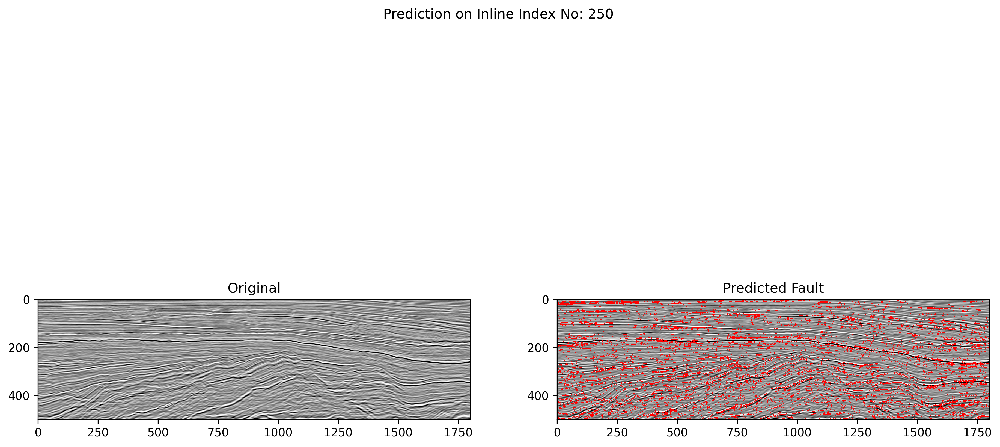

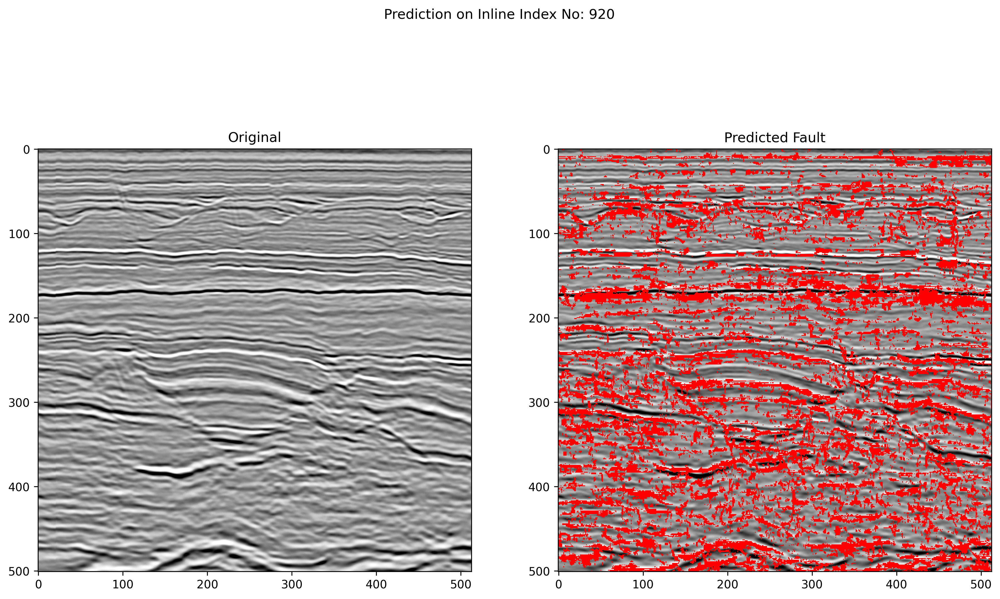

/usr/local/lib/python3.7/dist-packages/segyio/utils.py:23: RuntimeWarning: Implicit conversion from int64 to float32 (narrowing)
  warnings.warn(msg.format(x.dtype, dtype), RuntimeWarning)


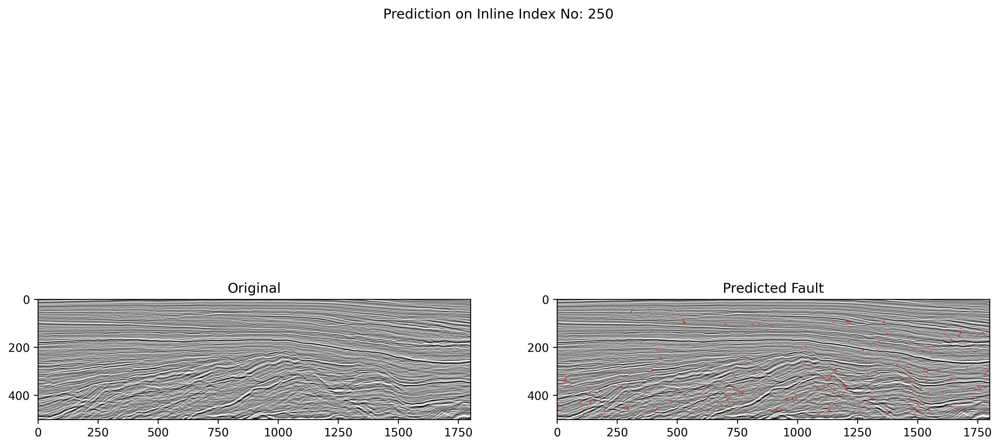

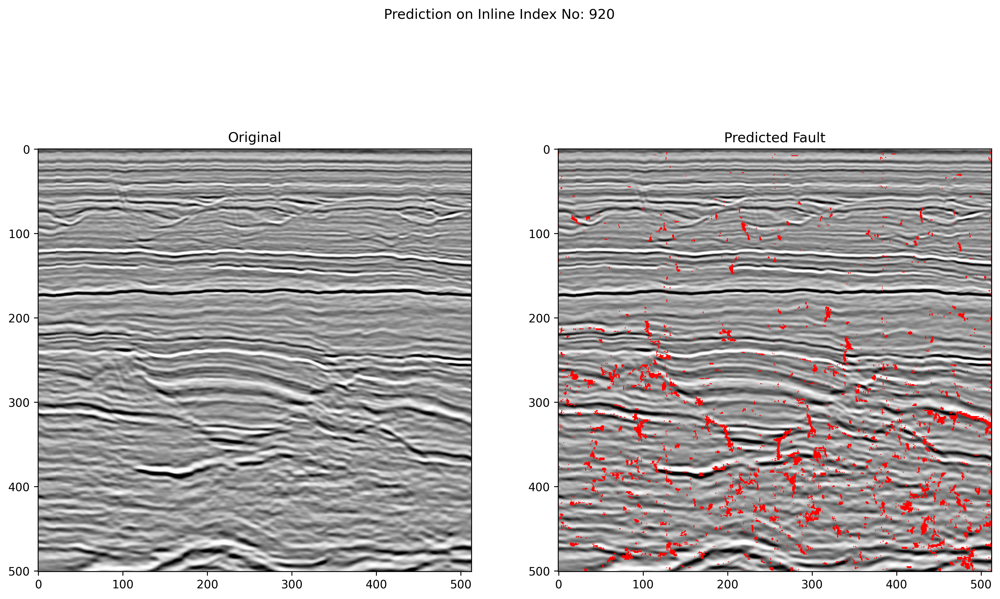

In [26]:
filename = '/content/drive/MyDrive/UTP_dGB_Documents/data/torosa-seismic/PloverTorosaSubArea_1015-1527_1500-3300_2-4_32bit.sgy'
outname_1 = '/'.join(filename.split('.')[0].split('/')[:-1])+'/Result/'+filename.split('.')[0].split('/')[-1]+'_UNet_VGG_All_Prediction.sgy'
outname_2 = '/'.join(filename.split('.')[0].split('/')[:-1])+'/Result/'+filename.split('.')[0].split('/')[-1]+'_UNet_VGG_11_Prediction.sgy'
seismic = segyio.tools.cube(filename)
seisnorm = normalization(seismic)
# All Layers
prediction_1 = predict_patch(seisnorm, model_unet_vgg_1)
visualize_result(seismic, prediction_1, mode='inline', index=250)
visualize_result(seismic, prediction_1, mode='crossline', index=920)
export_segy(filename, outname_1, prediction_1)
# 11 Layers
prediction_2 = predict_patch(seisnorm, model_unet_vgg_2)
visualize_result(seismic, prediction_2, mode='inline', index=250)
visualize_result(seismic, prediction_2, mode='crossline', index=920)
export_segy(filename, outname_2, prediction_2)

###### DSMF

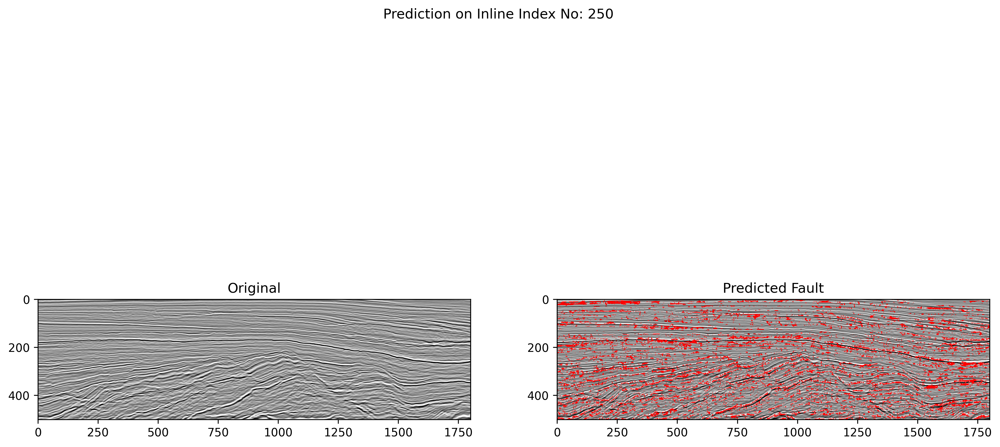

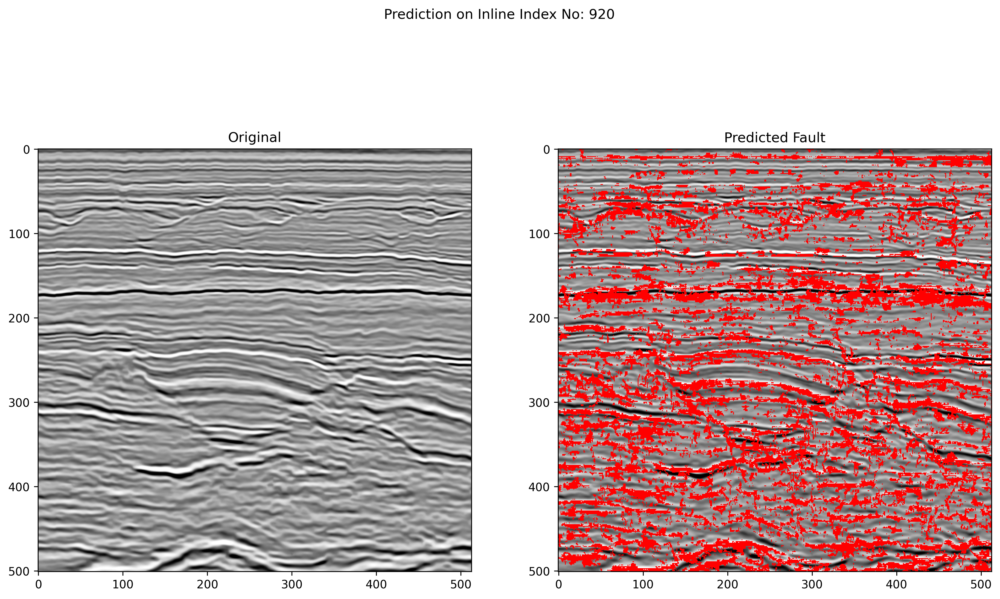

/usr/local/lib/python3.7/dist-packages/segyio/utils.py:23: RuntimeWarning: Implicit conversion from int64 to float32 (narrowing)
  warnings.warn(msg.format(x.dtype, dtype), RuntimeWarning)


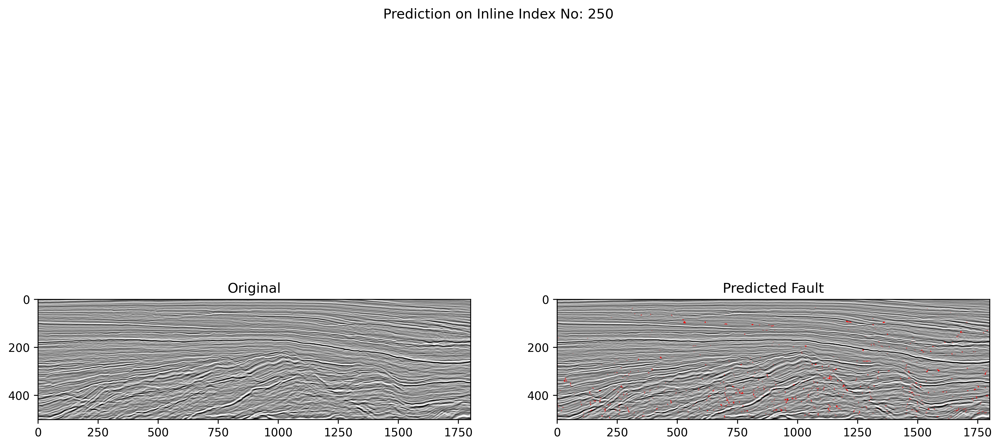

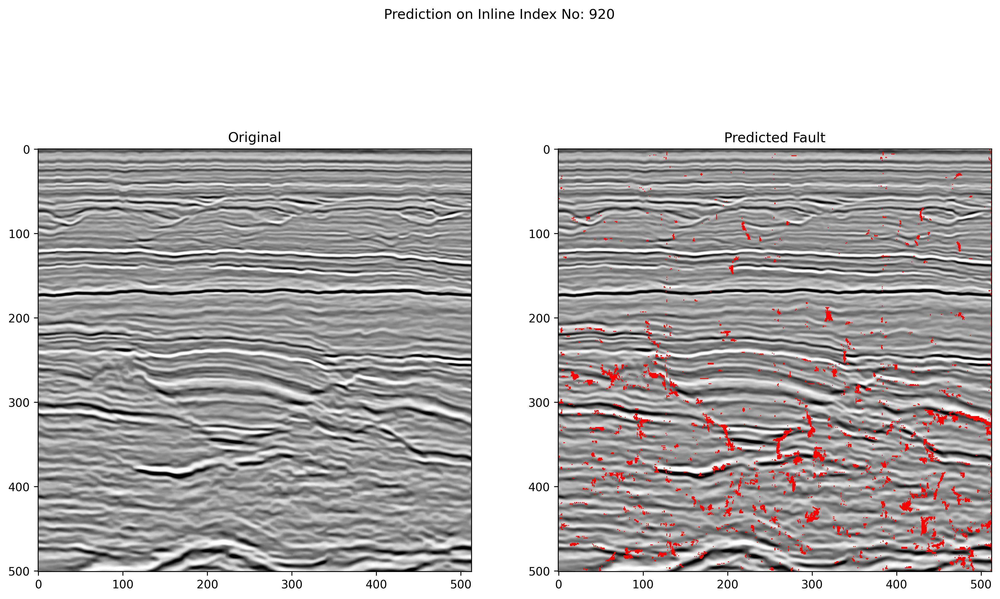

In [11]:
filename = '/content/drive/MyDrive/UTP_dGB_Documents/data/torosa-seismic/PloverTorosaSubArea_1015-1527_1500-3300_2-4_32bit_DSMF.sgy'
outname_1 = '/'.join(filename.split('.')[0].split('/')[:-1])+'/Result/'+filename.split('.')[0].split('/')[-1]+'_UNet_VGG_All_Prediction.sgy'
outname_2 = '/'.join(filename.split('.')[0].split('/')[:-1])+'/Result/'+filename.split('.')[0].split('/')[-1]+'_UNet_VGG_11_Prediction.sgy'
seismic = segyio.tools.cube(filename)
seisnorm = normalization(seismic)
# All Layers
prediction_1 = predict_patch(seisnorm, model_unet_vgg_1)
visualize_result(seismic, prediction_1, mode='inline', index=250)
visualize_result(seismic, prediction_1, mode='crossline', index=920)
export_segy(filename, outname_1, prediction_1)
# 11 Layers
prediction_2 = predict_patch(seisnorm, model_unet_vgg_2)
visualize_result(seismic, prediction_2, mode='inline', index=250)
visualize_result(seismic, prediction_2, mode='crossline', index=920)
export_segy(filename, outname_2, prediction_2)

###### EPS

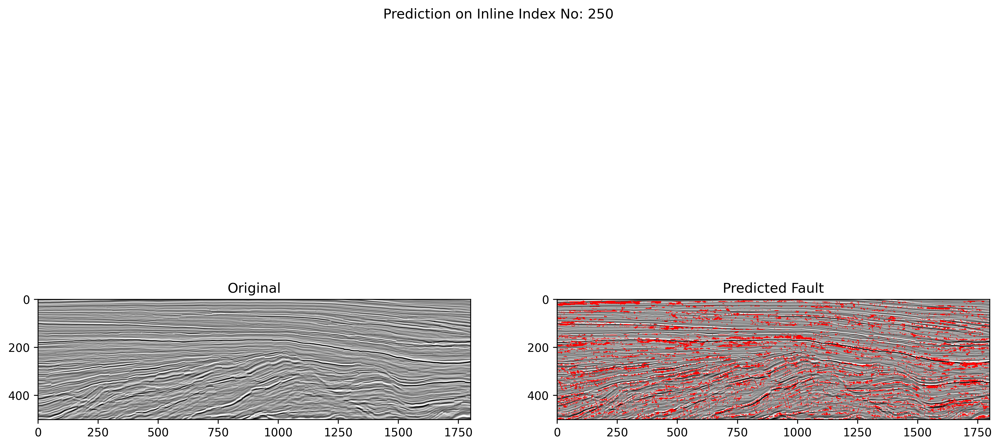

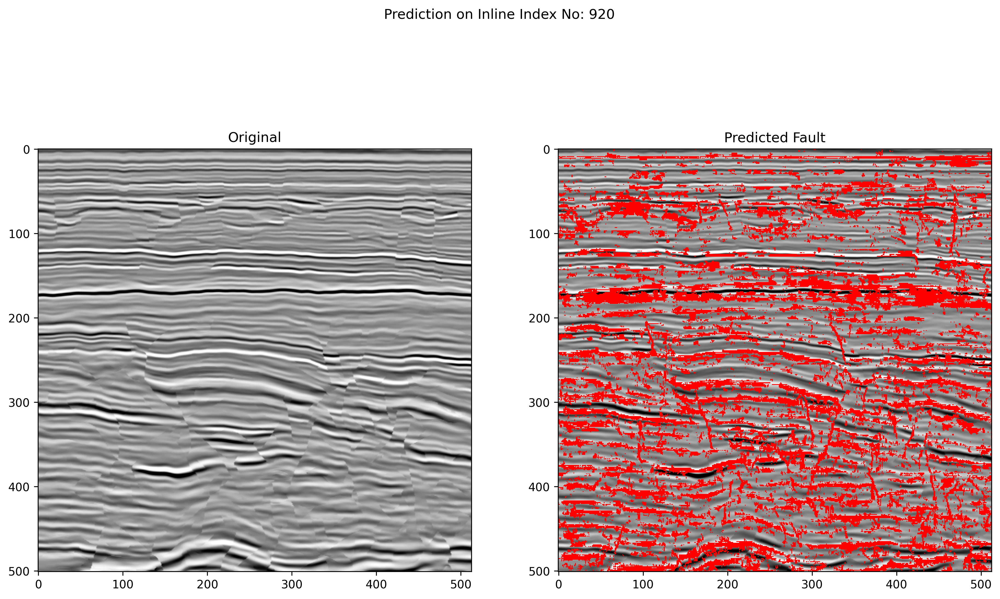

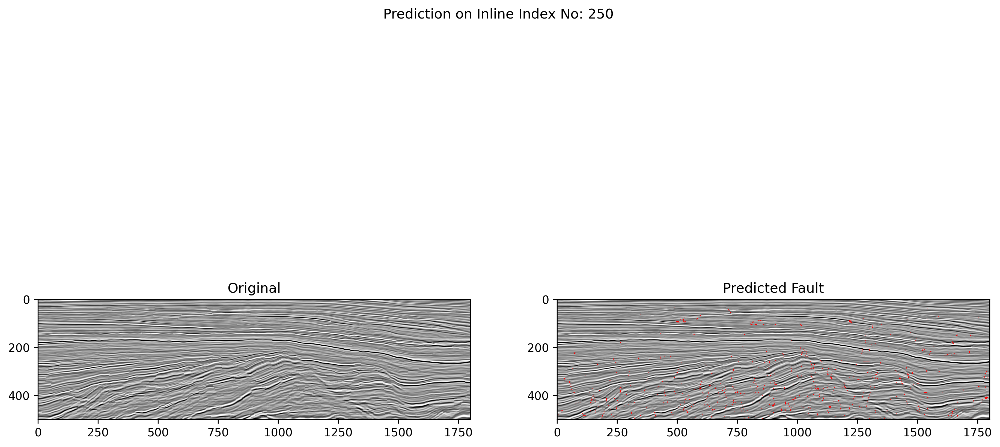

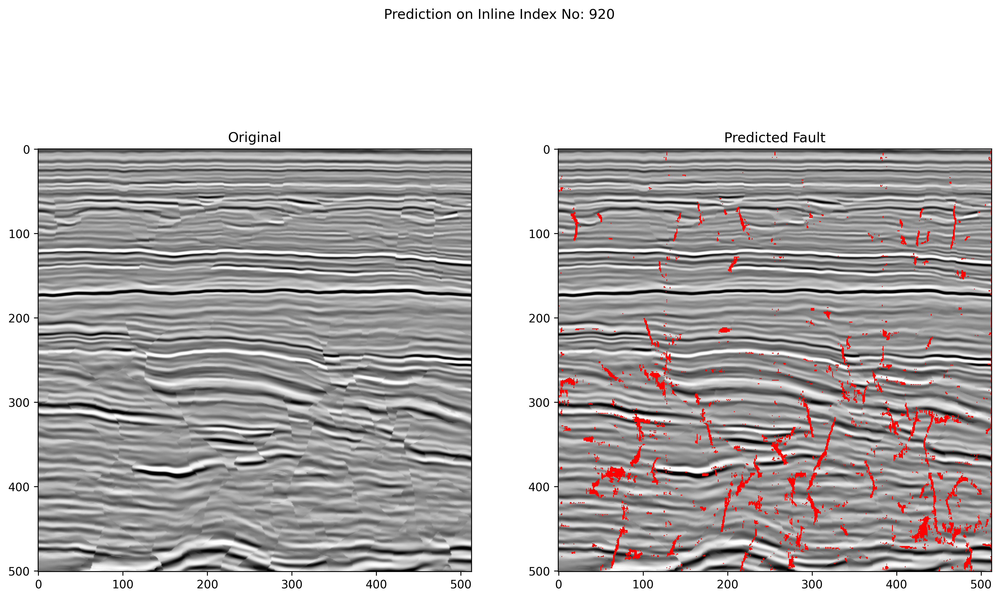

In [12]:
filename = '/content/drive/MyDrive/UTP_dGB_Documents/data/torosa-seismic/PloverTorosaSubArea_1015-1527_1500-3300_2-4_32bit_EPS.sgy'
outname_1 = '/'.join(filename.split('.')[0].split('/')[:-1])+'/Result/'+filename.split('.')[0].split('/')[-1]+'_UNet_VGG_All_Prediction.sgy'
outname_2 = '/'.join(filename.split('.')[0].split('/')[:-1])+'/Result/'+filename.split('.')[0].split('/')[-1]+'_UNet_VGG_11_Prediction.sgy'
seismic = segyio.tools.cube(filename)
seisnorm = normalization(seismic)
# All Layers
prediction_1 = predict_patch(seisnorm, model_unet_vgg_1)
visualize_result(seismic, prediction_1, mode='inline', index=250)
visualize_result(seismic, prediction_1, mode='crossline', index=920)
export_segy(filename, outname_1, prediction_1)
# 11 Layers
prediction_2 = predict_patch(seisnorm, model_unet_vgg_2)
visualize_result(seismic, prediction_2, mode='inline', index=250)
visualize_result(seismic, prediction_2, mode='crossline', index=920)
export_segy(filename, outname_2, prediction_2)